In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.subplots as tls
import seaborn as sns
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans, SpectralClustering
from sklearn.metrics import silhouette_score
import matplotlib
#%matplotlib inline

# Import the dimensionality reduction methods
from sklearn.manifold import TSNE
from sklearn import manifold, datasets

def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

train = pd.read_csv('C:\\Users\\Saite\\Desktop\\Bobby\\train1.csv')
# save the labels to a Pandas series target
target = train['label']
# Drop the label feature
train = train.drop("label",axis=1)

# Standardize the data
from sklearn.preprocessing import StandardScaler
X = train.values
X_std = StandardScaler().fit_transform(X)


range(0, 784) range(0, 784)


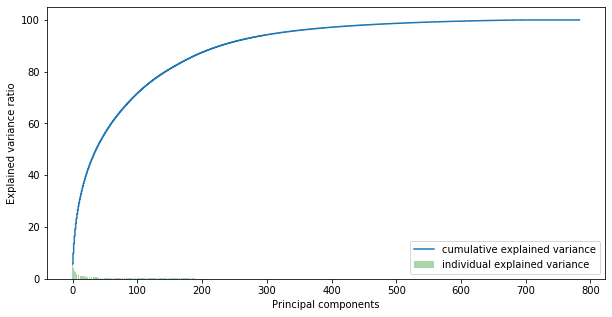

In [2]:
#Calculating Eigenvecors and eigenvalues of Covariance matrix
mean_vec = np.mean(X_std, axis=0)
cov_mat = np.cov(X_std.T)
eig_vals, eig_vecs = np.linalg.eig(cov_mat)

# Create a list of (eigenvalue, eigenvector) tuples
eig_pairs = [ (np.abs(eig_vals[i]),eig_vecs[:,i]) for i in range(len(eig_vals))]

# Sort from high to low
eig_pairs.sort(key = lambda x: x[0], reverse= True)

# Calculation of Explained Variance from the eigenvalues
tot = sum(eig_vals)
var_exp = [(i/tot)*100 for i in sorted(eig_vals, reverse=True)] # Individual explained variance
cum_var_exp = np.cumsum(var_exp) # Cumulative explained variance
rng=range(0,784)
# PLOT OUT THE EXPLAINED VARIANCES SUPERIMPOSED 
plt.figure(figsize=(10, 5))
plt.bar(rng, var_exp, alpha=0.3333, align='center', label='individual explained variance', color = 'g')
plt.step(rng, cum_var_exp, where='mid',label='cumulative explained variance')
print(range(len(var_exp)),range(len(cum_var_exp)))
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components')
plt.legend(loc='best')
plt.show()

In [18]:
# Invoking the 2D t-SNE method
tsne = TSNE(n_components=2)
tsne_results2D = tsne.fit_transform(X_std)
Target = target#remeber to pass all the labels

#2D plot
traceTSNE = go.Scatter(
    x = tsne_results2D[:,0],
    y = tsne_results2D[:,1],
    mode = 'markers',
    text = Target,
    showlegend = True,
    marker = dict(
        size = 8,
        color = Target,
        colorscale ='Jet',
        showscale = False,
        line = dict(
            width = 2,
            color = 'rgb(255, 255, 255)'
        ),
        opacity = 0.8
    )
)
data = [traceTSNE]

layout = go.Layout(title = '2D TSNE (T-Distributed Stochastic Neighbour Embedding)',
              hovermode= 'closest',
              xaxis = dict(zeroline = False),
              yaxis = dict(zeroline = False),
              showlegend= False,

             )

fig = dict(data=data, layout=layout)
py.iplot(fig, filename='2D-scatter')

In [19]:
# KMeans clustering 
# Set a KMeans clustering with 9 components ( 9 chosen sneakily ;) as hopefully we get back our 9 class labels)
kmeans = KMeans(n_clusters=10)
# Compute cluster centers and predict cluster indices
X_clustered = kmeans.fit_predict(tsne_results2D)

trace_Kmeans = go.Scatter(x=tsne_results2D[:, 0], y= tsne_results2D[:, 1], mode="markers",
                    showlegend=False,
                    marker=dict(
                            size=8,
                            color = X_clustered,
                            colorscale = 'Portland',
                            showscale=False, 
                            line = dict(
            width = 2,
            color = 'rgb(255, 255, 255)'
        )
                   ))

layout = go.Layout(
    title= 'KMeans Clustering',
    hovermode= 'closest',
    xaxis= dict(
         title= 'First Principal Component',
        ticklen= 5,
        zeroline= False,
        gridwidth= 2,
    ),
    yaxis=dict(
        title= 'Second Principal Component',
        ticklen= 5,
        gridwidth= 2,
    ),
    showlegend= True
)

data = [trace_Kmeans]
fig1 = dict(data=data, layout= layout)
py.iplot(fig1, filename="KM")
print('Clustering Score',silhouette_score(tsne_results2D,X_clustered))

Clustering Score 0.38525262


In [ ]:
X_clustered = SpectralClustering(n_clusters=10, affinity='nearest_neighbors',n_neighbors=12,#nearest_neighbors
                          assign_labels='kmeans',random_state=0).fit_predict(tsne_results2D)

trace_sc = go.Scatter(x=tsne_results2D[:, 0], y= tsne_results2D[:, 1], mode="markers",
                    showlegend=False,
                    marker=dict(
                            size=8,
                            color = X_clustered,
                            colorscale = 'Portland',
                            showscale=False, 
                            line = dict(
            width = 2,
            color = 'rgb(255, 255, 255)'
        )
                   ))

layout = go.Layout(
    title= 'Spectral Clustering',
    hovermode= 'closest',
    xaxis= dict(
         title= 'First Principal Component',
        ticklen= 5,
        zeroline= False,
        gridwidth= 2,
    ),
    yaxis=dict(
        title= 'Second Principal Component',
        ticklen= 5,
        gridwidth= 2,
    ),
    showlegend= True
)

data = [trace_sc]
fig1 = dict(data=data, layout= layout)
py.iplot(fig1, filename="SC")
print('Clustering Score',silhouette_score(tsne_results2D,X_clustered))

In [6]:
# Invoking the 3D t-SNE method
tsne = TSNE(n_components=3)
tsne_results3D = tsne.fit_transform(X_std)
Target = target#remeber to pass all the labels

traceTSNE = go.Scatter3d(
    x = tsne_results3D[:,0],
    y = tsne_results3D[:,1],
    z = tsne_results3D[:,2],
    mode = 'markers',
    text = Target,
    showlegend = True,
    marker = dict(
        size = 8,
        color = Target,
        colorscale ='Jet',
        showscale = False,
        line = dict(
            width = 2,
            color = 'rgb(255, 255, 255)'
        ),
        opacity = 0.8
    )
)
data = [traceTSNE]

layout = go.Layout(title = '3D TSNE (T-Distributed Stochastic Neighbour Embedding)',
              hovermode= 'closest',
              xaxis = dict(zeroline = False),
              yaxis = dict(zeroline = False),
              showlegend= False,

             )

fig = dict(data=data, layout=layout)
py.iplot(fig, filename='3D-scatter')

In [7]:
# KMeans clustering 
# Set a KMeans clustering with 9 components ( 9 chosen sneakily ;) as hopefully we get back our 9 class labels)
kmeans = KMeans(n_clusters=10)
# Compute cluster centers and predict cluster indices
X_clustered = kmeans.fit_predict(tsne_results3D)

trace_Kmeans = go.Scatter3d(x=tsne_results3D[:, 0], y= tsne_results3D[:, 1],z=tsne_results3D[:, 2], mode="markers",
                    showlegend=False,
                    marker=dict(
                            size=8,
                            color = X_clustered,
                            colorscale = 'Portland',
                            showscale=False, 
                            line = dict(
            width = 2,
            color = 'rgb(255, 255, 255)'
        )
                   ))

layout = go.Layout(
    title= 'KMeans Clustering',
    hovermode= 'closest',
    xaxis= dict(
         title= 'First Principal Component',
        ticklen= 5,
        zeroline= False,
        gridwidth= 2,
    ),
    yaxis=dict(
        title= 'Second Principal Component',
        ticklen= 5,
        gridwidth= 2,
    ),
    showlegend= True
)

data = [trace_Kmeans]
fig1 = dict(data=data, layout= layout)
py.iplot(fig1, filename="KM")
print('Clustering Score',silhouette_score(tsne_results3D,X_clustered))

Clustering Score 0.27895087


In [8]:
X_clustered = SpectralClustering(n_clusters=9, affinity='nearest_neighbors',
                          assign_labels='kmeans',random_state=0).fit_predict(tsne_results3D)

trace_sc = go.Scatter3d(x=tsne_results3D[:, 0], y= tsne_results3D[:, 1],z=tsne_results3D[:, 2], mode="markers",
                    showlegend=False,
                    marker=dict(
                            size=8,
                            color = X_clustered,
                            colorscale = 'Portland',
                            showscale=False, 
                            line = dict(
            width = 2,
            color = 'rgb(255, 255, 255)'
        )
                   ))

layout = go.Layout(
    title= 'Spectral Clustering',
    hovermode= 'closest',
    xaxis= dict(
         title= 'First Principal Component',
        ticklen= 5,
        zeroline= False,
        gridwidth= 2,
    ),
    yaxis=dict(
        title= 'Second Principal Component',
        ticklen= 5,
        gridwidth= 2,
    ),
    showlegend= True
)

data = [trace_sc]
fig1 = dict(data=data, layout= layout)
py.iplot(fig1, filename="SC")
print('Clustering Score',silhouette_score(tsne_results3D,X_clustered))

Clustering Score 0.26091027
